In [1]:
import numpy as np
from sklearn.model_selection import StratifiedKFold, GridSearchCV, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier
from sklearn.metrics import roc_auc_score, make_scorer
import os
from sklearn import metrics
import seaborn as seabornInstance 

from sklearn.linear_model import LinearRegression
import pandas as pd
from fancyimpute import KNN
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import chi2_contingency
from random import randrange, uniform

Using TensorFlow backend.


In [2]:
sample_matrix = np.matrix('123;456')

In [3]:
sample_matrix

matrix([[123],
        [456]])

In [4]:
sample_matrix *2
sample_matrix/3

matrix([[ 41.],
        [152.]])

In [5]:
# now we will work with dataframe
df = pd.DataFrame({'age':[1,2,3],
                  'gender':["male","female","M"],
                   'Income':[12,23,34]
                   
                  })

In [6]:
df

,age,gender,Income
0,1,male,12
1,2,female,23
2,3,M,34


In [7]:
df.rename(columns = {'gender':'gender_vi',
                     'Income':'Income_vi'})

,age,gender_vi,Income_vi
0,1,male,12
1,2,female,23
2,3,M,34


In [8]:
from ggplot import mtcars
df_mtcars = mtcars

ModuleNotFoundError: No module named 'ggplot'

In [9]:
from ggplot import mtcars

ModuleNotFoundError: No module named 'ggplot'

In [10]:
german = pd.read_csv("German.csv")
german

FileNotFoundError: [Errno 2] File German.csv does not exist: 'German.csv'

In [2]:
os.chdir('/Users/chandan/desktop/eduWork_project/')

In [ ]:
german['newcol'] = 0

In [ ]:
german

In [ ]:
german['newcol'] = german['Duration'] + german['Amount']

In [23]:
os.chdir("/Users/chandan/desktop/eduWork_project/")

In [7]:
for i in range(len(german)):
    german['newcol'].loc[i] = german['Amount'].loc[i] + german['Duration'].loc[i]    

NameError: name 'german' is not defined

In [ ]:
german

In [3]:
data = pd.read_csv("train.csv")

In [26]:
data

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
2,train_2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
3,train_3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
4,train_4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199995,train_199995,0,11.4880,-0.4956,8.2622,3.5142,10.3404,11.6081,5.6709,15.1516,...,6.1415,13.2305,3.9901,0.9388,18.0249,-1.7939,2.1661,8.5326,16.6660,-17.8661
199996,train_199996,0,4.9149,-2.4484,16.7052,6.6345,8.3096,-10.5628,5.8802,21.5940,...,4.9611,4.6549,0.6998,1.8341,22.2717,1.7337,-2.1651,6.7419,15.9054,0.3388
199997,train_199997,0,11.2232,-5.0518,10.5127,5.6456,9.3410,-5.4086,4.5555,21.5571,...,4.0651,5.4414,3.1032,4.8793,23.5311,-1.5736,1.2832,8.7155,13.8329,4.1995
199998,train_199998,0,9.7148,-8.6098,13.6104,5.7930,12.5173,0.5339,6.0479,17.0152,...,2.6840,8.6587,2.7337,11.1178,20.4158,-0.0786,6.7980,10.0342,15.5289,-13.9001


In [20]:
data.shape
data.head()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
2,train_2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
3,train_3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
4,train_4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104


In [34]:
#missing value present there would be
missing_val = pd.DataFrame(data.isnull().sum())
missing_val = missing_val.rename(columns = {'index': 'Variables', 0: 'Missing_percentage'})

#Calculate percentage
missing_val['Missing_percentage'] = (missing_val['Missing_percentage']/len(data))*100

#descending order
missing_val = missing_val.sort_values('Missing_percentage', ascending = False).reset_index(drop = True)

#save output results 
missing_val.to_csv("Miising_perc.csv", index = False)

In [35]:
data['var_0'].loc[70] = np.nan

/Users/chandan/anaconda3/lib/python3.6/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)


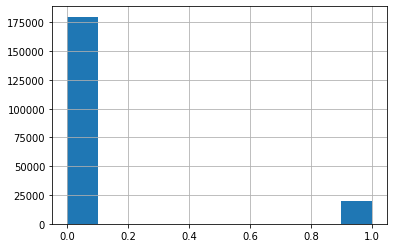

In [36]:
data["target"].hist()

In [ ]:
#imputation method
#mean = 10.67991236556198
#median = 10.5247
#actual value = 8.5576
#knn = 

In [37]:
data["var_0"] = data["var_0"].fillna(data["var_0"].median())

In [38]:
data["var_0"].loc[70]

10.5247

In [39]:
lis = []
for i in range(0, data.shape[1]):
    #print(i)
    if(data.iloc[:,i].dtypes == 'object'):
        data.iloc[:,i] = pd.Categorical(data.iloc[:,i])
        #print(marketing_train[[i]])
        data.iloc[:,i] = data.iloc[:,i].cat.codes 
        data.iloc[:,i] = data.iloc[:,i].astype('object')
        
        lis.append(data.columns[i])
    

In [40]:
for i in range(0, data.shape[1]):
    data.iloc[:,i] = data.iloc[:,i].replace(-1, np.nan) 

In [ ]:
data = pd.DataFrame(KNN(k = 3).fit_transform(data), columns = data.columns)


In [ ]:
#data visualization
data['var_0'].hist()
data['var_1'].hist()

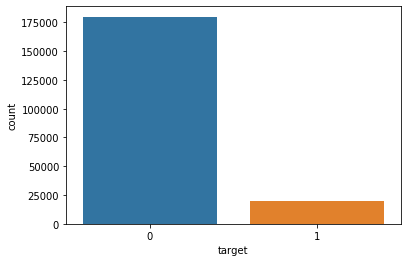

In [8]:
sns.countplot(x ='target',data = data)

In [41]:
for i in lis:
    data.loc[:,i] = data.loc[:,i].round()
    data.loc[:,i] = data.loc[:,i].astype('object')

TypeError: loop of ufunc does not support argument 0 of type int which has no callable rint method

In [ ]:
 df.copy() = data

In [7]:
data.columns

Index(['ID_code', 'target', 'var_0', 'var_1', 'var_2', 'var_3', 'var_4',
       'var_5', 'var_6', 'var_7',
       ...
       'var_190', 'var_191', 'var_192', 'var_193', 'var_194', 'var_195',
       'var_196', 'var_197', 'var_198', 'var_199'],
      dtype='object', length=202)

In [ ]:
 %matplotlib inline  
plt.boxplot(data)
#cnames =  ["var_0", "var_1", "var_3", "var_4", "var_5", "var_6", "var_7", "var_190",
           "var_193", "var_195", "var_8"]
cnames = data 
for i in cnames:
    print(i)
    q75, q25 = np.percentile(data.loc[:,i], [5 ,10])
     iqr = q75 - q25

     min = q25 - (iqr*1.5)
     max = q75 + (iqr*1.5)
     print(min)
     print(max)
    
     data = data.drop(data[data.loc[:,i] < min].index)
     data = data.drop(data[data.loc[:,i] > max].index)
    

In [ ]:
Extract quartiles
 q75, q25 = np.percentile(data['var_0'], [8 ,25])

 #Calculate IQR
 iqr = q75 - q25

 #Calculate inner and outer fence
 minimum = q25 - (iqr*1.5)
 maximum = q75 + (iqr*1.5)

# #Replace with NA
 data.loc[data['var_0'] < minimum,:'var_0'] = np.nan
 data.loc[data['var_0'] > maximum,:'var_0'] = np.nan

# #Calculate missing value
 missing_val = pd.DataFrame(data.isnull().sum())

# #Impute with KNN
 data = pd.DataFrame(KNN(k = 3).complete(data), columns = data.columns)

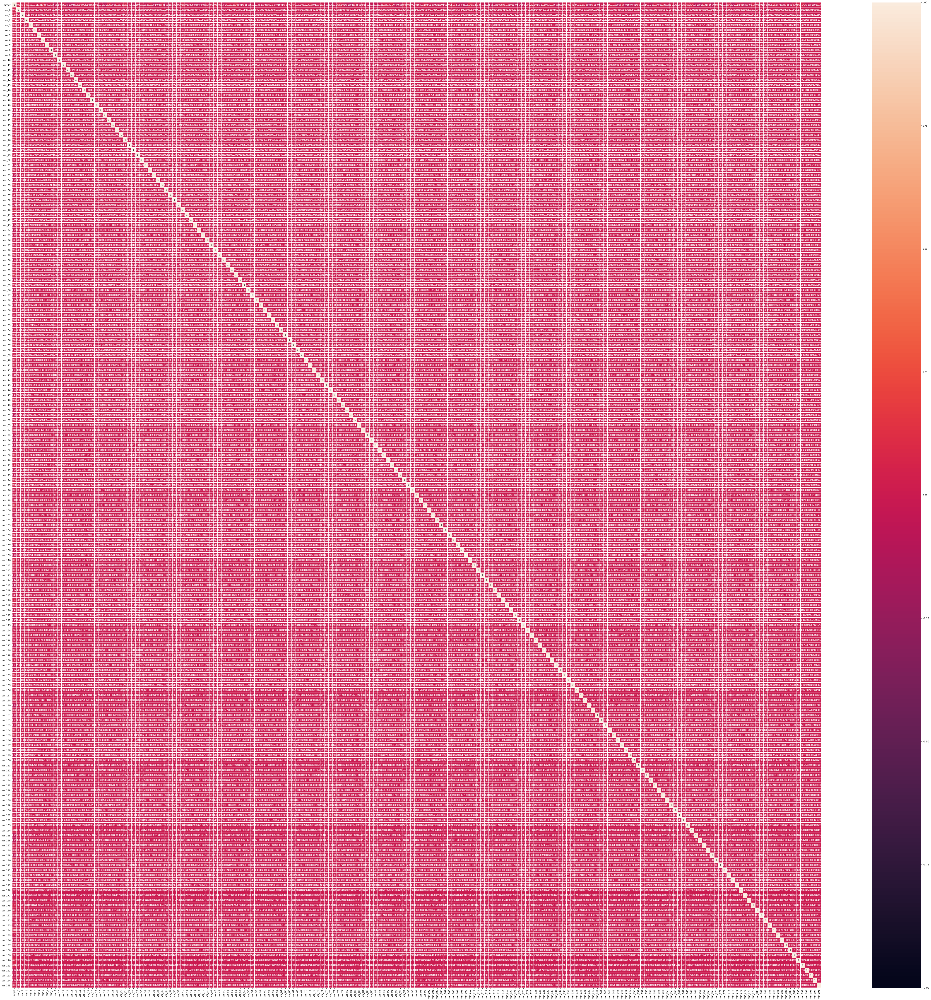

In [6]:
corr=data.iloc[:,:198].corr()
fig, ax=plt.subplots(figsize=(80,80))
# Generate a custom diverging colormap
Cmap=sns.diverging_palette(220,10,as_cmap=True)

# Draw the heatmap
_= sns.heatmap(corr,  ax=ax, annot=True,   vmin=-1, linewidths=0.2)

In [44]:
cat_names = ["var_0", "var_1", "var_3", "var_4", "var_5", "var_6", "var_7", "var_190",
           "var_193", "var_195", "var_8"]

In [45]:
for i in cat_names:
    print(i)
    chi2, p, dof, ex = chi2_contingency(pd.crosstab(data['target'],data[i]))
    print(p)

var_0
8.156264417076628e-12
var_1
0.00013565987300318507
var_3
0.11813916716337647
var_4
0.00988300654413312
var_5
0.027199727249985036
var_6
1.691776105034717e-19
var_7
0.4198459186395863
var_190
3.553359104410358e-05
var_193
0.049194278072635586
var_195
3.788911905527895e-05
var_8
0.4089244234890551


In [ ]:
for i in data.columns:
    sns.FacetGrid(data['target'],size=8)\
        .map(sns.distplot ,i)
plt.legend()    


In [13]:
rf = RandomForestClassifier( max_depth=10, verbose=3, n_estimators=20)
parameters = {'n_estimators': [120, 100], 'max_depth':[3,5,]}
grid = GridSearchCV(rf, parameters, cv=3, n_jobs=-1, verbose=3, scoring=make_scorer(roc_auc_score))

In [14]:
df_train_FS=data
grid.fit(df_train_FS.drop(["target",'ID_code'], axis=1).values, df_train_FS.target.values)


Fitting 3 folds for each of 4 candidates, totalling 12 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 out of  12 | elapsed: 13.5min remaining:  2.7min
[Parallel(n_jobs=-1)]: Done  12 out of  12 | elapsed: 15.0min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 120


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.1s remaining:    0.0s


building tree 2 of 120


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    2.3s remaining:    0.0s


building tree 3 of 120
building tree 4 of 120
building tree 5 of 120
building tree 6 of 120
building tree 7 of 120
building tree 8 of 120
building tree 9 of 120
building tree 10 of 120
building tree 11 of 120
building tree 12 of 120
building tree 13 of 120
building tree 14 of 120
building tree 15 of 120
building tree 16 of 120
building tree 17 of 120
building tree 18 of 120
building tree 19 of 120
building tree 20 of 120
building tree 21 of 120
building tree 22 of 120
building tree 23 of 120
building tree 24 of 120
building tree 25 of 120
building tree 26 of 120
building tree 27 of 120
building tree 28 of 120
building tree 29 of 120
building tree 30 of 120
building tree 31 of 120
building tree 32 of 120
building tree 33 of 120
building tree 34 of 120
building tree 35 of 120
building tree 36 of 120
building tree 37 of 120
building tree 38 of 120
building tree 39 of 120
building tree 40 of 120
building tree 41 of 120
building tree 42 of 120
building tree 43 of 120
building tree 44 of 120

[Parallel(n_jobs=1)]: Done 120 out of 120 | elapsed:  2.5min finished


GridSearchCV(cv=3, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=10,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=20, n_jobs=None,
                                              oob_score=False,
                                              random_s

In [3]:
grid.best_score_


NameError: name 'grid' is not defined

In [27]:
#linear regression
X=data.drop(columns=['ID_code','target'],axis=1)
test=data.drop(columns=['ID_code'],axis=1)
y=data['target']
X_train,X_valid,y_train,y_valid=train_test_split(X,y,random_state=42)
lr = LinearRegression()
lr.fit(X_train,y_train)
#print(lr.intercept_)
#print(lr.coef_)
y_pred = lr.predict(X_valid)
y_pred

print('Shape of X_train :',X_train.shape)
print('Shape of X_valid :',X_valid.shape)
print('Shape of y_train :',y_train.shape)
print('Shape of y_valid :',y_valid.shape)

Shape of X_train : (150000, 200)
Shape of X_valid : (50000, 200)
Shape of y_train : (150000,)
Shape of y_valid : (50000,)


In [28]:
y_valid = np.array(list(y_valid))
y_pred = np.array(y_pred)




In [29]:
df = pd.DataFrame({'Actual': y_valid.flatten(), 'Predicted': y_pred.flatten()})
df


,Actual,Predicted
0,0,-0.205909
1,0,-0.058148
2,0,-0.049301
3,0,0.144592
4,1,0.301205
...,...,...
49995,0,-0.249130
49996,0,0.272905
49997,0,0.089682
49998,0,-0.067162


ValueError: x and y must be the same size

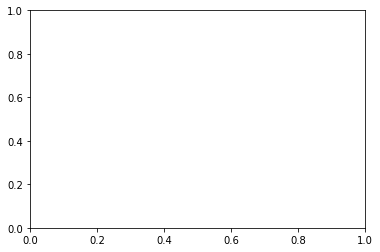

In [30]:
plt.scatter(X_valid, y_valid,  color='gray')
plt.plot(X_valid, y_pred, color='red', linewidth=2)
plt.show()


In [25]:
# mail
%%time
#Random forest classifier
rf_model=RandomForestClassifier(n_estimators=10,random_state=42)
#fitting the model
rf_model.fit(X_train,y_train) 

UsageError: Line magic function `%%time` not found.


In [12]:
#
%%time
#Permutation importance
from eli5.sklearn import PermutationImportance
perm_imp=PermutationImportance(rf_model,random_state=42)
#fitting the model
perm_imp.fit(X_valid,y_valid)

/Users/chandan/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.metrics.scorer module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)
/Users/chandan/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.feature_selection.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.feature_selection. Anything that cannot be imported from sklearn.feature_selection is now part of the private API.
  warnings.warn(message, FutureWarning)


NameError: name 'rf_model' is not defined

In [47]:
#decision trees
feature_cols = data.drop(["target",'ID_code'], axis=1)
X = data[feature_cols]
y = data.label
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1) # 70% training and 30% test

clf = DecisionTreeClassifier()

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))


ValueError: Boolean array expected for the condition, not float64

In [ ]:
#logistic regression
feature_cols1 = data.drop(["target",'ID_code'], axis=1)
X = data[feature_cols1]
y = data.label

In [ ]:
from sklearn.cross_validation import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.25,random_state=0)

In [ ]:
from sklearn.linear_model import LogisticRegression

# instantiate the model (using the default parameters)
logreg = LogisticRegression()

# fit the model with data
logreg.fit(X_train,y_train)

#
y_pred=logreg.predict(X_test)